#  Taxi Order Forecasting

The company "Cheerful Taxi" has collected historical data on taxi orders at airports. To attract more drivers during peak periods, it is necessary to forecast the number of taxi orders for the next hour. Build a model for such prediction.

The RMSE metric value on the test set should not exceed 48.

# Research Steps:

1. Load the data and resample it on an hourly basis.
2. Analyze the data.
3. Train different models with various hyperparameters.
4. Create a test set comprising 10% of the original data. Choose a model based on the RMSE metric with a requirement of <= 48.
5. Validate the model using the test set.

The data is available in the file taxi.csv, and the number of orders is located in the column named num_orders.

## Preparation

Import all the necessary libraries.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import lightgbm as lgb
import time
import catboost

from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from statsmodels.tsa.seasonal import seasonal_decompose
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error

Let's load the data from the dataset.

In [2]:
pth1_ar = ['/Users/daniyardjumaliev/Jupyter/Projects/datasets/taxi.csv']
pth2_ar = ['backup_path1.csv']
df = None

for pth1, pth2 in zip(pth1_ar, pth2_ar):
    if os.path.exists(pth1):
        df = pd.read_csv(pth1)
    elif os.path.exists(pth2):
        df = pd.read_csv(pth2)
    else:
        print(f'Warning: File not found in both paths for {pth1} and {pth2}')
else:
    print('File loaded successfully.')

File loaded successfully.


Currently, we only have one source from which we obtain the file for investigation. If alternative paths for locating the file arise in the future, they can be added to a second array. This helps avoid errors during the data loading stage. Alternatively, create a third, fourth, and so on, following the same approach.

Let's check the data quality.

In [3]:
display(df.head(10))
display(df.tail(10))
display(df.describe())
df.info()
display(f'Duplicates: {df.duplicated().sum()}')
display(f'Missing values:')
display(df.isna().sum())

,datetime,num_orders
0,2018-03-01 00:00:00,9
1,2018-03-01 00:10:00,14
2,2018-03-01 00:20:00,28
3,2018-03-01 00:30:00,20
4,2018-03-01 00:40:00,32
5,2018-03-01 00:50:00,21
6,2018-03-01 01:00:00,7
7,2018-03-01 01:10:00,5
8,2018-03-01 01:20:00,17
9,2018-03-01 01:30:00,12


,datetime,num_orders
26486,2018-08-31 22:20:00,48
26487,2018-08-31 22:30:00,41
26488,2018-08-31 22:40:00,34
26489,2018-08-31 22:50:00,34
26490,2018-08-31 23:00:00,30
26491,2018-08-31 23:10:00,32
26492,2018-08-31 23:20:00,24
26493,2018-08-31 23:30:00,27
26494,2018-08-31 23:40:00,39
26495,2018-08-31 23:50:00,53


,num_orders
count,26496.000000
mean,14.070463
std,9.211330
min,0.000000
25%,8.000000
50%,13.000000
75%,19.000000
max,119.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   datetime    26496 non-null  object
 1   num_orders  26496 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 414.1+ KB


'Duplicates: 0'

'Missing values:'

datetime      0
num_orders    0
dtype: int64

_Conclusion_: The data is of high quality, with no missing values or anomalous outliers. In this case, zero values in the target feature are entirely logical, as the number of orders can be zero during specific time intervals.

Now let's preprocess the data by converting the date column into the datetime64 format.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    26496 non-null  datetime64[ns]
 1   num_orders  26496 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 414.1 KB


None

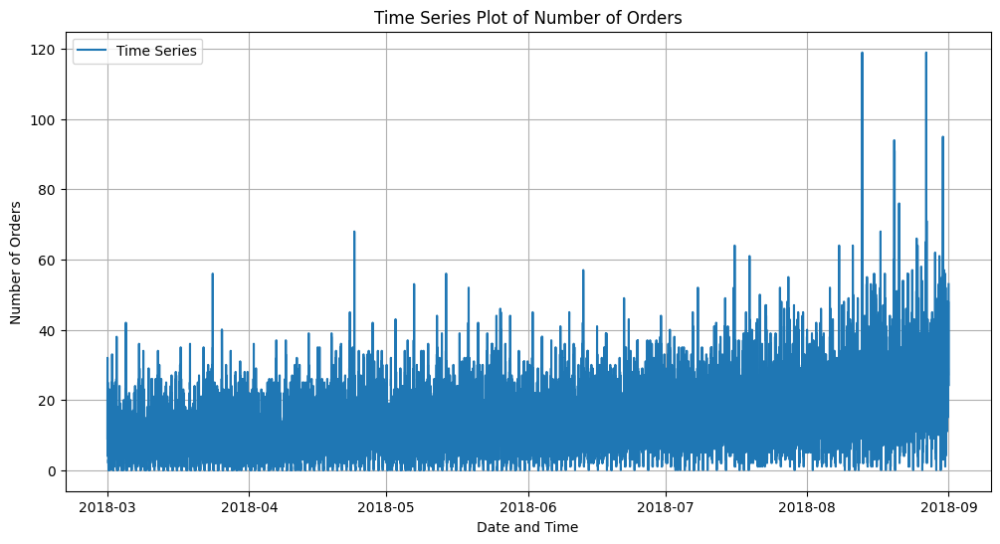

In [4]:
df['datetime'] = pd.to_datetime(df['datetime'])
display(df.info())

plt.figure(figsize=(12, 6))
plt.plot(df['datetime'], df['num_orders'], label='Time Series')
plt.xlabel('Date and Time')
plt.ylabel('Number of Orders')
plt.title('Time Series Plot of Number of Orders')
plt.legend()
plt.grid(True)
plt.show()

In [5]:
display(df['datetime'].max())
display(df['datetime'].min())

Timestamp('2018-08-31 23:50:00')

Timestamp('2018-03-01 00:00:00')

We have data available from March 1, 2018, to August 31, 2018.

Let's resample the data on an hourly basis.

,num_orders
count,4416.000000
mean,84.422781
std,45.023853
min,0.000000
25%,54.000000
50%,78.000000
75%,107.000000
max,462.000000


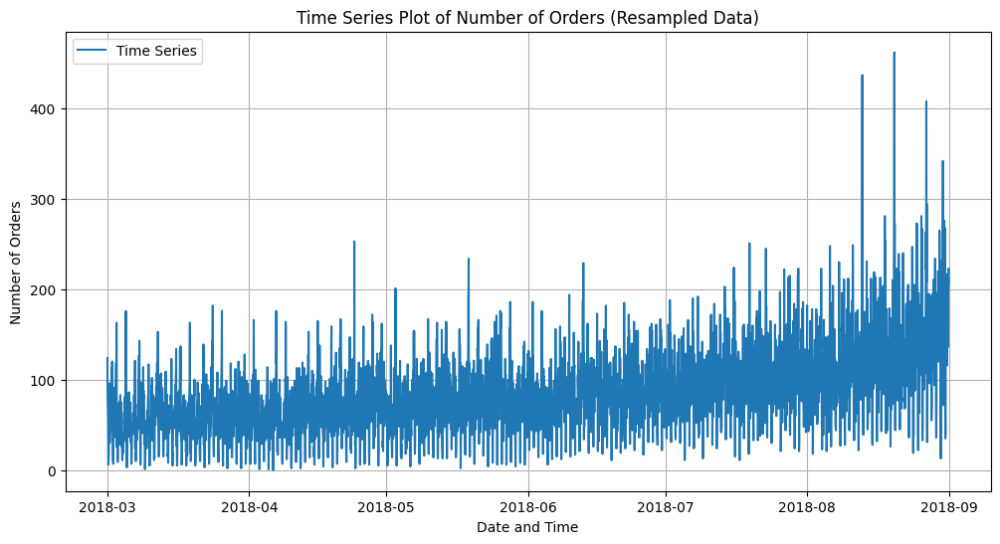

In [6]:
df = df.resample('1H', on='datetime').sum()
display(df.describe())
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['num_orders'], label='Time Series')
plt.xlabel('Date and Time')
plt.ylabel('Number of Orders')
plt.title('Time Series Plot of Number of Orders (Resampled Data)')
plt.legend()
plt.grid(True)
plt.show()

## Analysis

To analyze the data, let's examine the trend and seasonality.

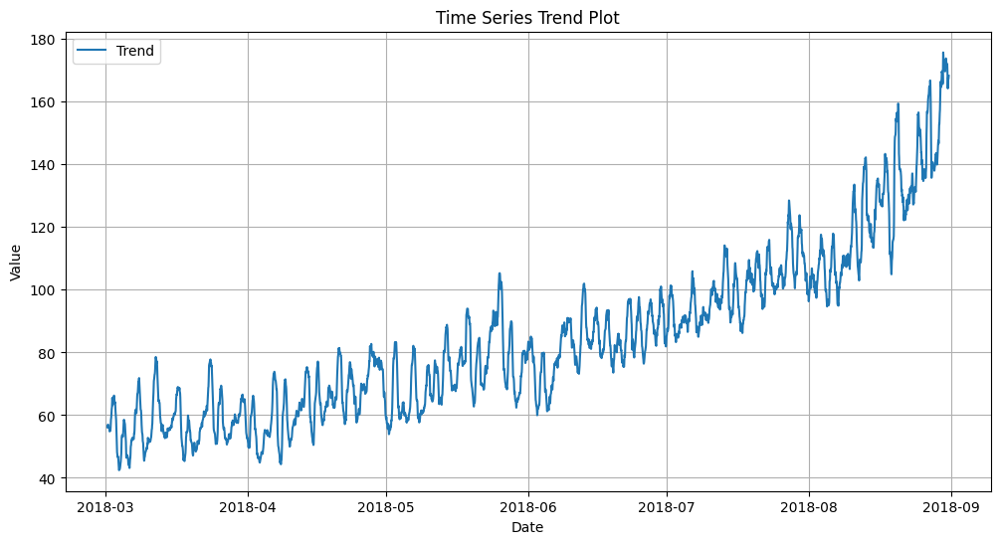

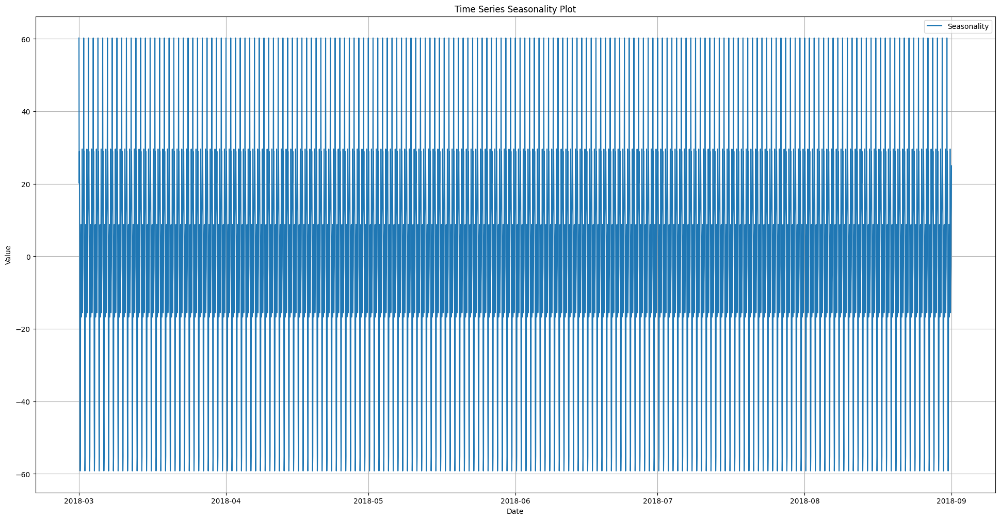

In [7]:
decomposed = seasonal_decompose(df)

trend = decomposed.trend
plt.figure(figsize=(12, 6))
ax = plt.gca()
plt.plot(trend, label='Trend')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Time Series Trend Plot')
plt.legend()
plt.grid(True)
plt.show()

seasonal = decomposed.seasonal
plt.figure(figsize=(24, 12))
ax = plt.gca()
plt.plot(seasonal, label='Seasonality')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Time Series Seasonality Plot')
plt.legend()
plt.grid(True)
plt.show()

The trend shows an increase in the number of orders. It is challenging to determine the cause of this growth—whether it is a general trend of increasing orders that will continue or simply a seasonal trend related, for example, to the summer being a vacation period, leading more people to use taxi services from airports. A significant spike in growth is evident from June to the end of August. To speak with confidence, data for multiple years would be needed.

It's challenging to discern much from the seasonality plot. Let's try creating separate plots for each month.

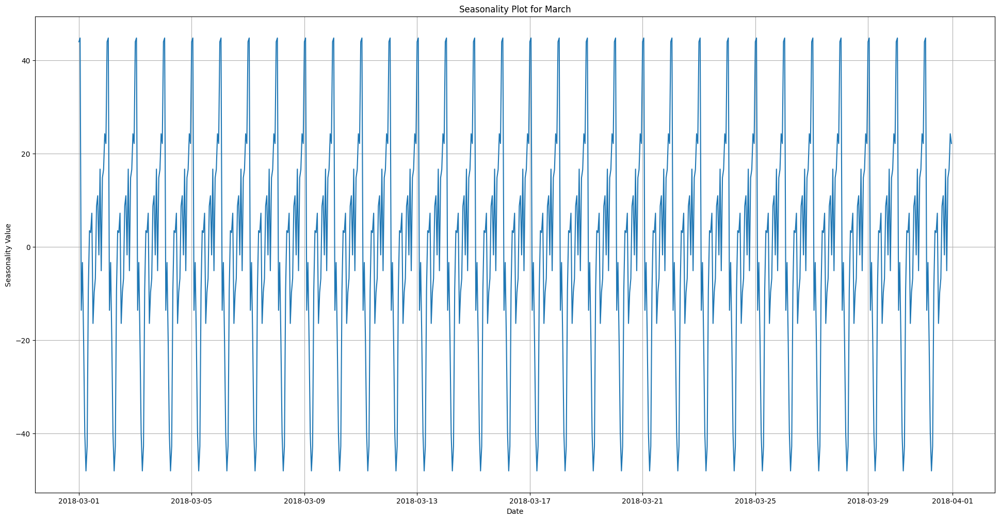

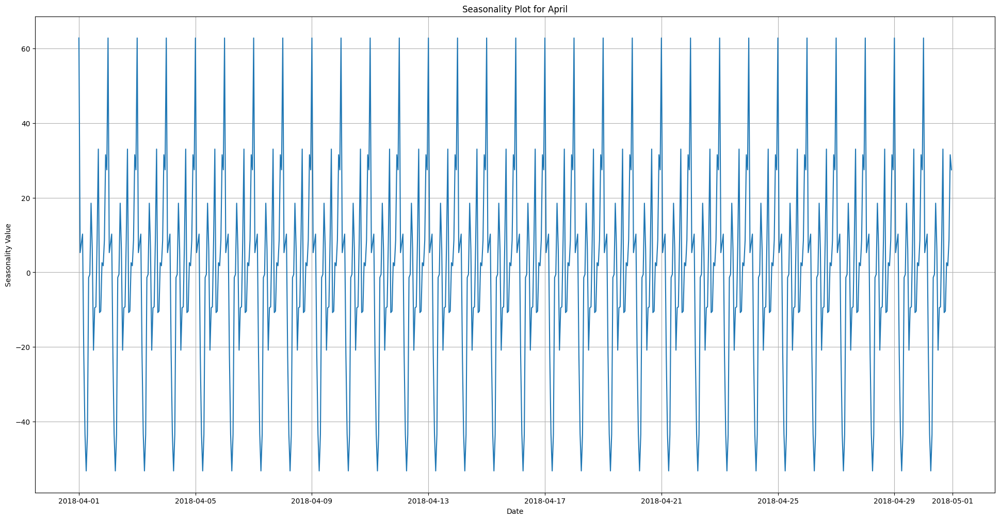

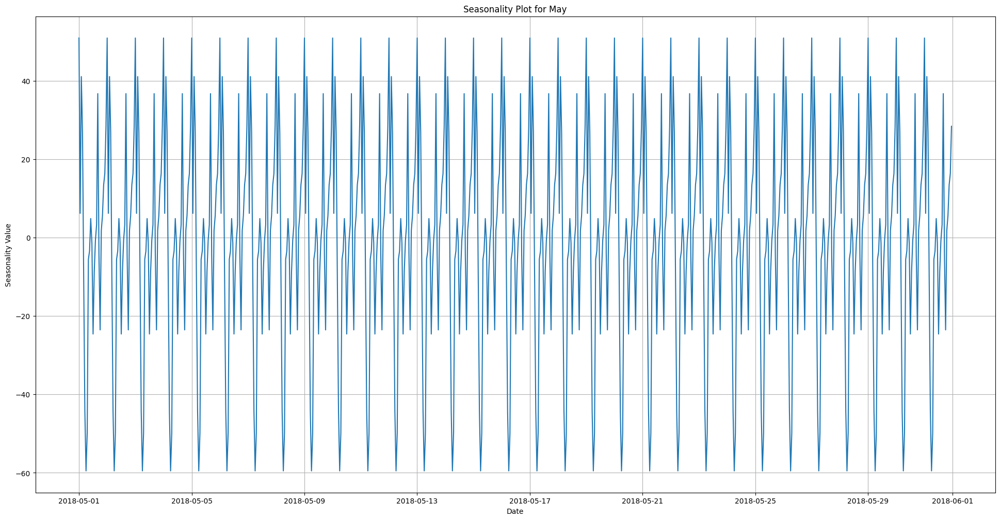

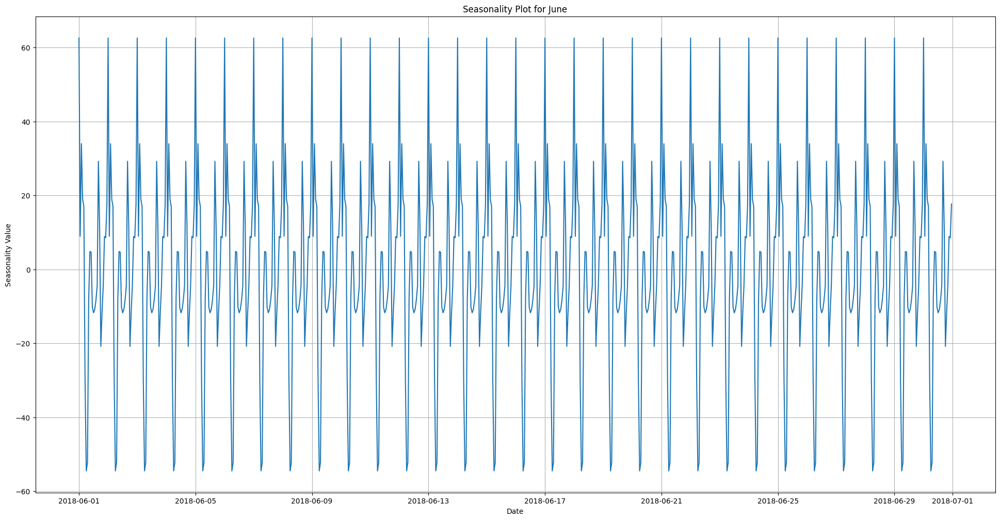

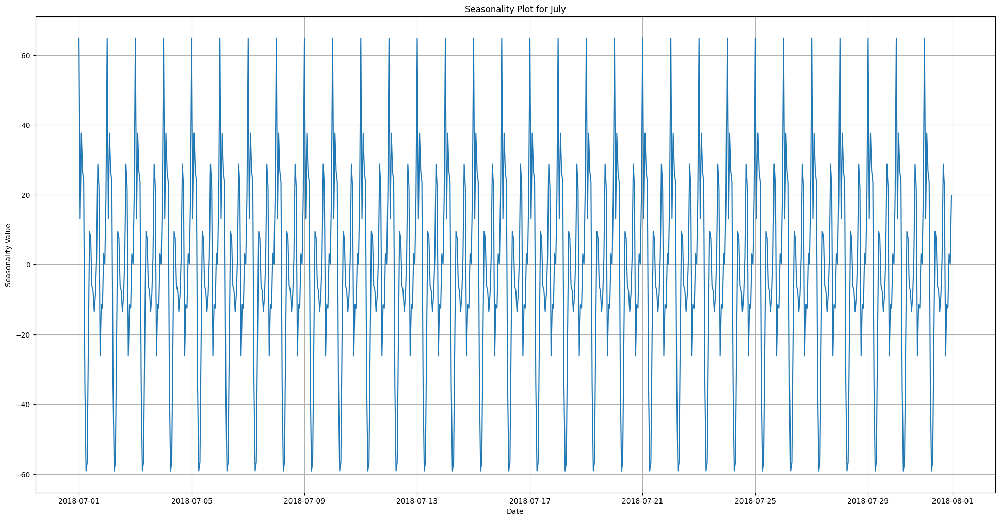

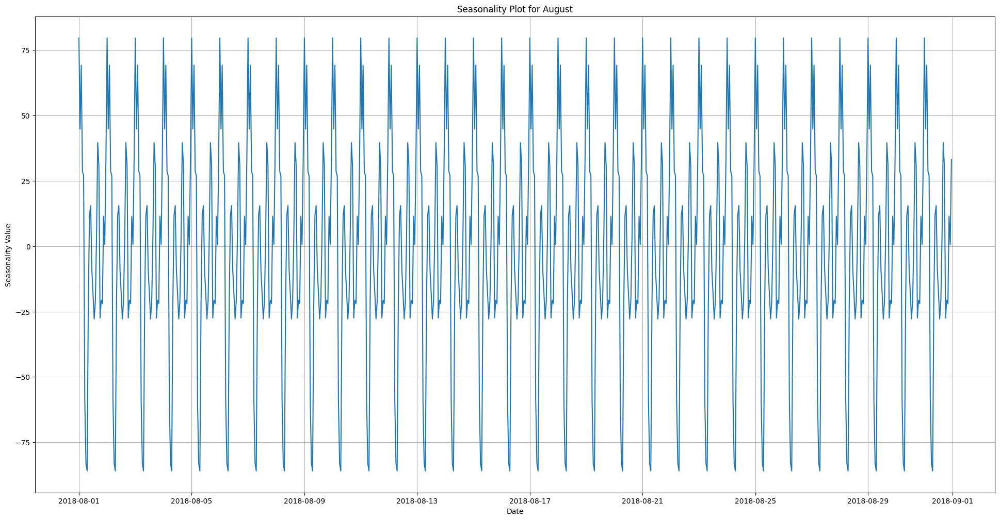

In [8]:
monthly_groups = df.resample('M')

for name, group in monthly_groups:
    plt.figure(figsize=(24, 12))
    seasonal_decomposition = seasonal_decompose(group)
    seasonal = seasonal_decomposition.seasonal
    plt.plot(seasonal.index, seasonal.values)
    plt.xlabel('Date')
    plt.ylabel('Seasonality Value')
    plt.title(f'Seasonality Plot for {name.strftime("%B")}')
    plt.grid(True)
    plt.show()

In the monthly seasonality plot, you can observe an increase in orders towards the end of each day, which repeats daily. This suggests that based on this data, it might be successful to predict peak loads for the next day based on the previous day.

Let's also examine seasonality on a weekly basis.

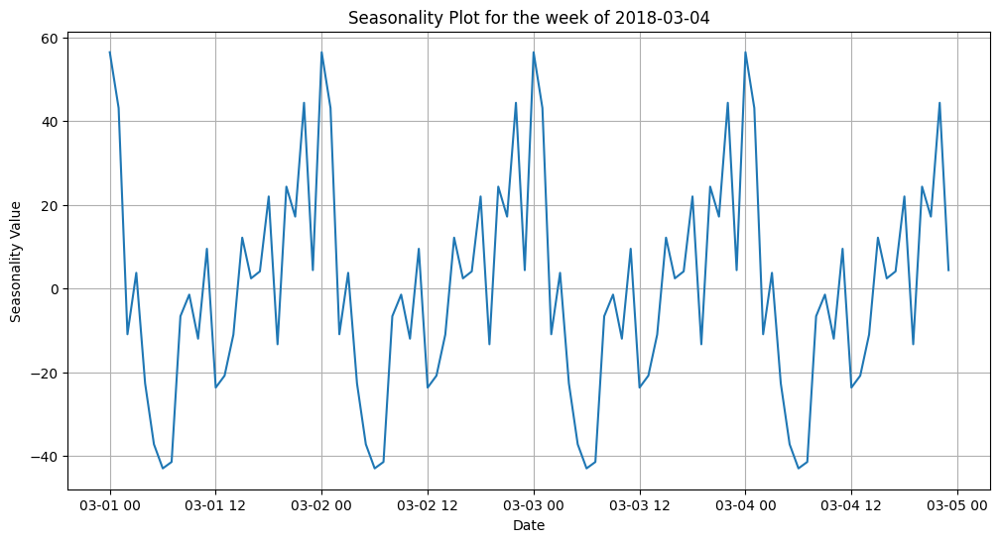

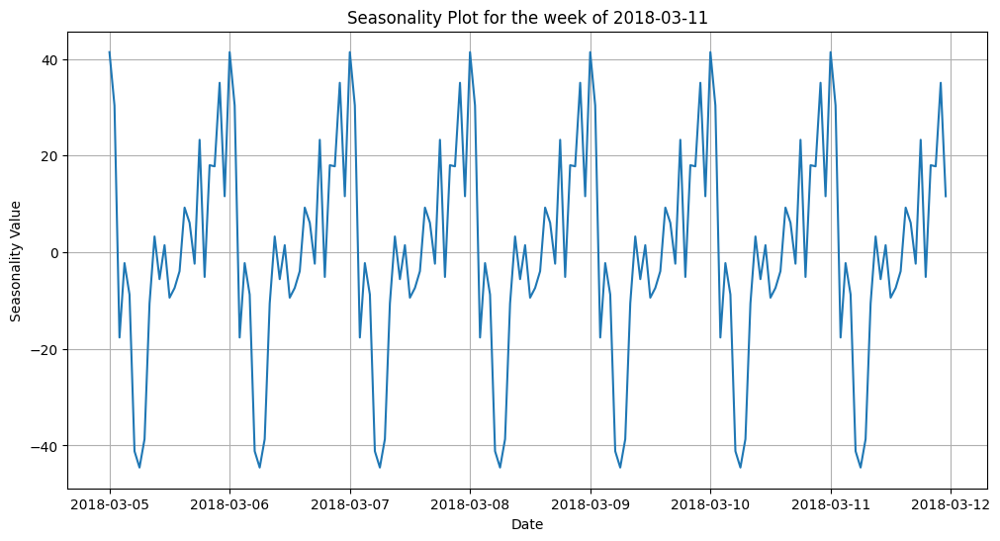

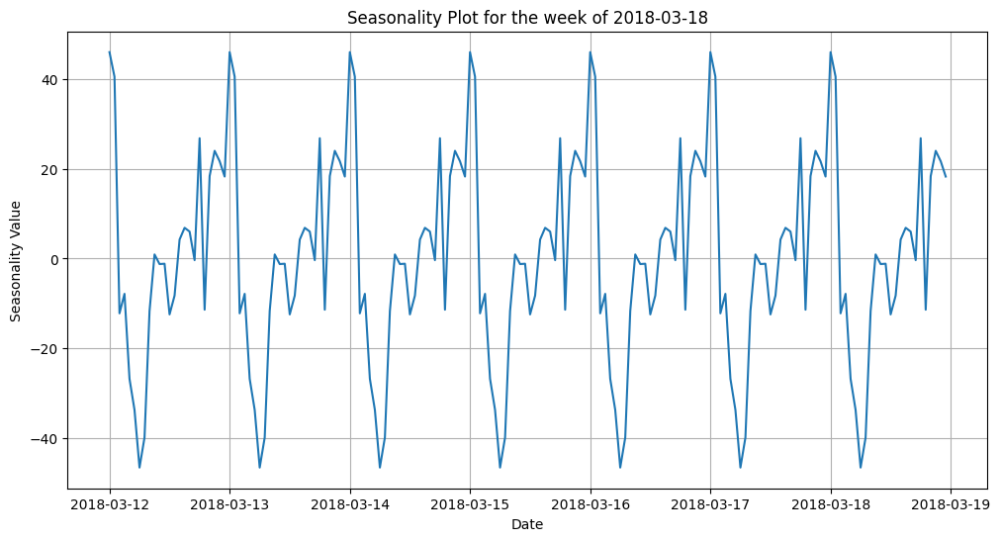

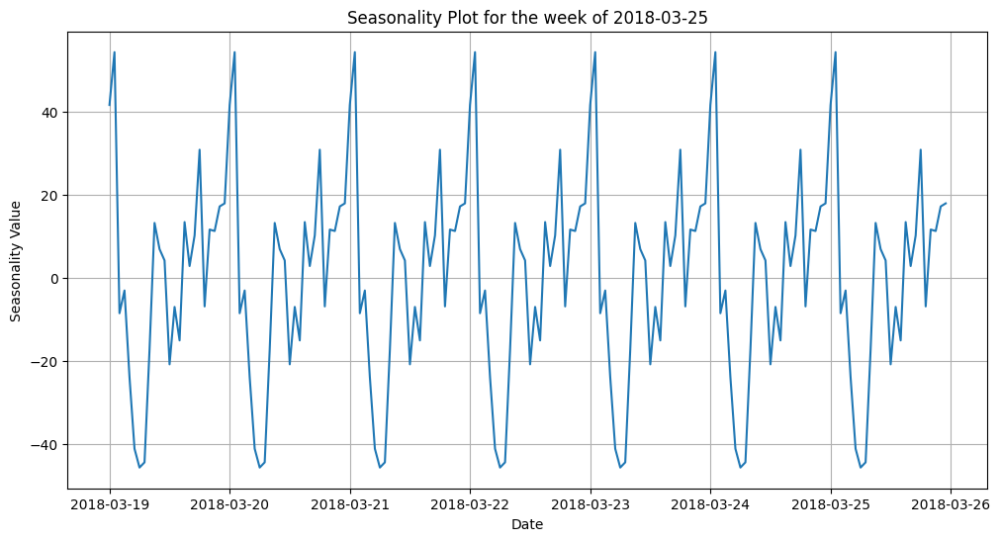

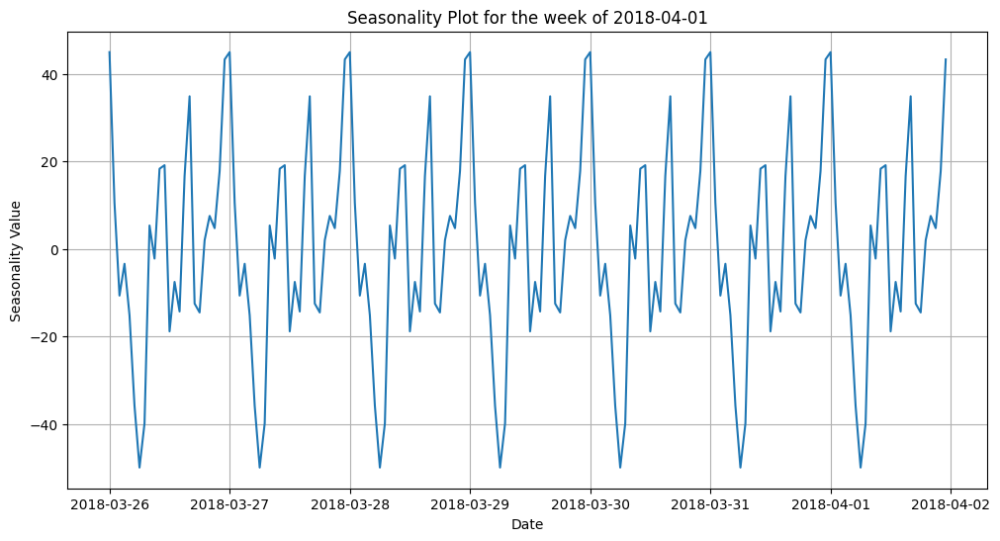

...

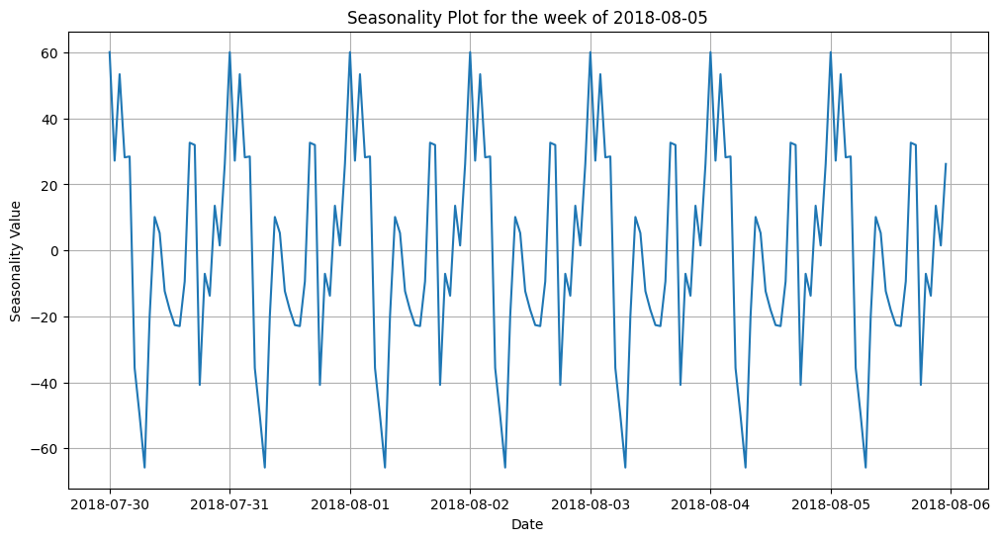

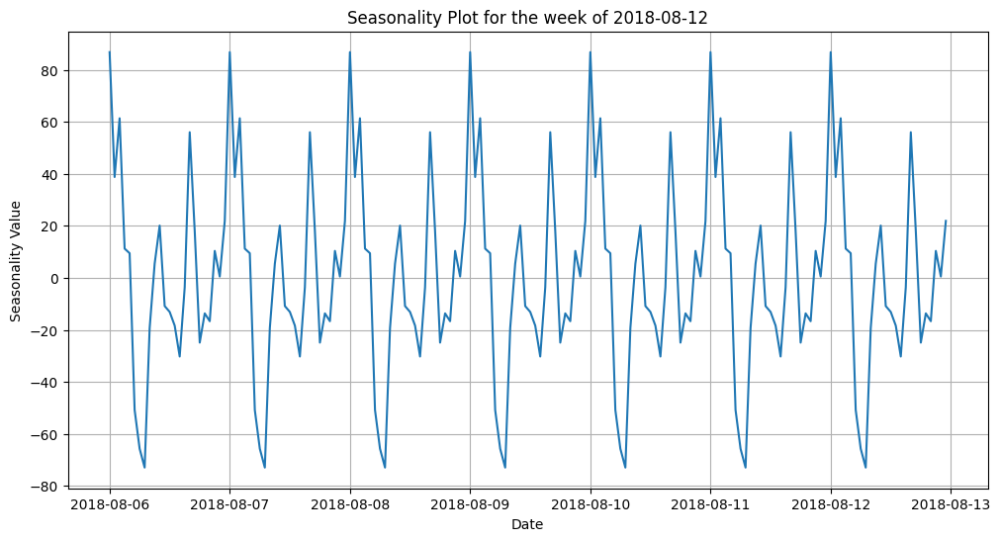

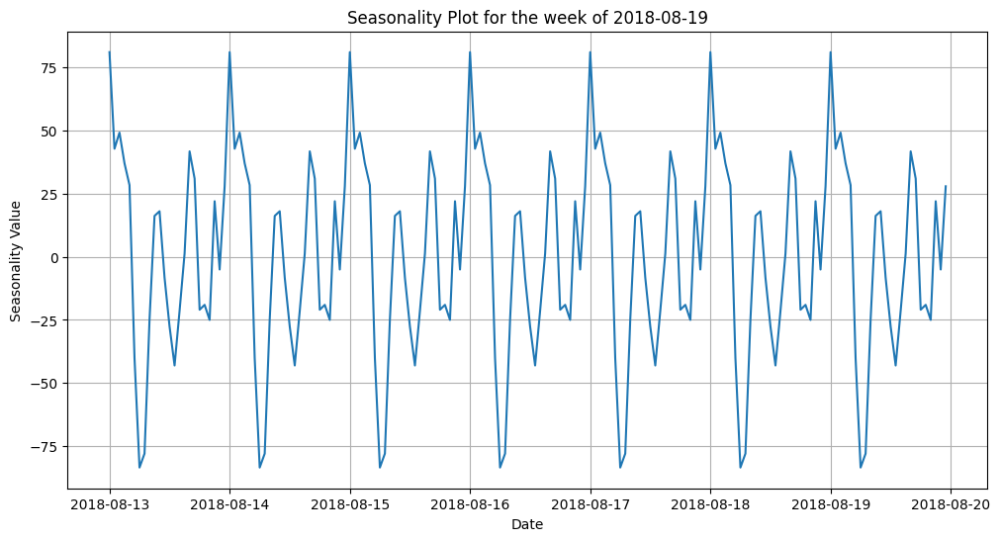

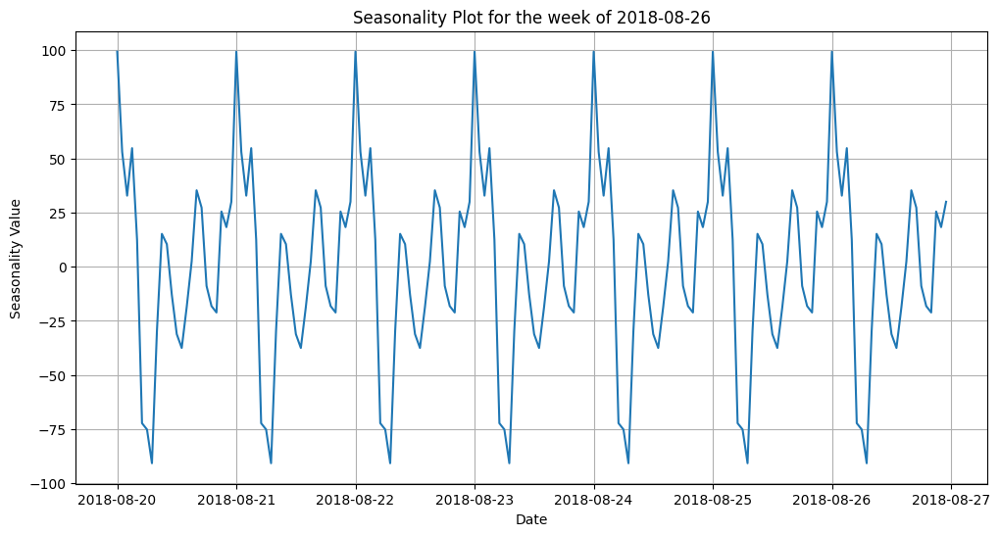

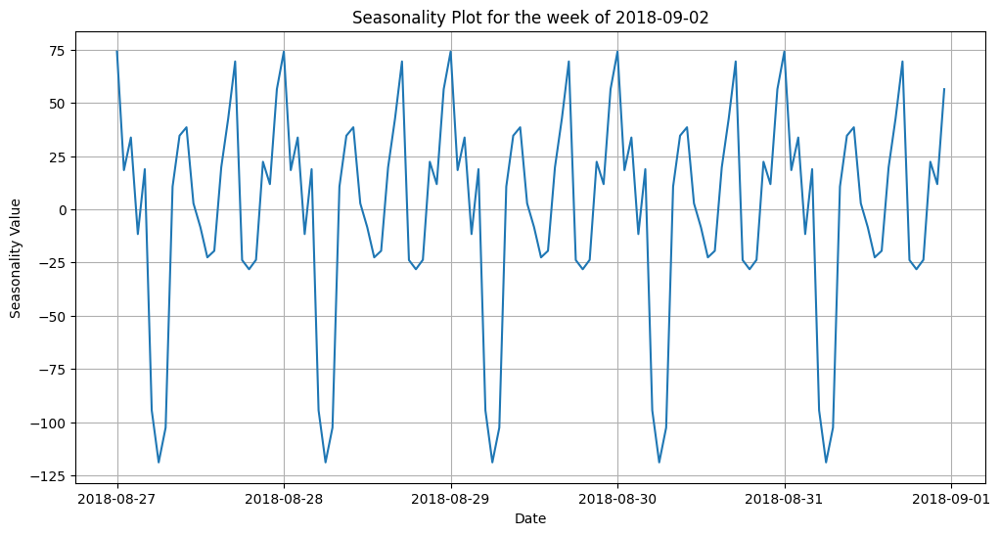

In [9]:
weekly_groups = df.resample('W')

for name, group in weekly_groups:
    plt.figure(figsize=(12, 6))
    seasonal_decomposition = seasonal_decompose(group)
    seasonal = seasonal_decomposition.seasonal
    plt.plot(seasonal.index, seasonal.values)
    plt.xlabel('Date')
    plt.ylabel('Seasonality Value')
    plt.title(f'Seasonality Plot for the week of {name.strftime("%Y-%m-%d")}')
    plt.grid(True)
    plt.show()

Weekly seasonality implies that certain events, patterns, or behaviors manifest with a specific periodicity within a week. Each day, the number of orders increases towards the end of the day with consistent periodicity. The time series is stationary, indicating that it can be used to forecast future data.

_Conclusion_: The trend shows growth, especially from June to August, suggesting a connection with the traditional vacation period. However, to speak with confidence, data spanning several years would be necessary. The data exhibits strong seasonality both on a monthly and weekly basis. The time series is stationary, with consistent periodicity towards the end of each day, making it suitable for predicting the number of orders for each subsequent hour.

## Training

Before starting model training, let's write a function that will add new features to our data. We'll break down the date into separate features—year, month, day, and day of the week. Additionally, we'll include lag values and moving averages.

In [10]:
def make_features(data, max_lag, rolling_mean_size):
    new_data = data.copy()
    new_data['year'] = new_data.index.year
    new_data['month'] = new_data.index.month
    new_data['day'] = new_data.index.day
    new_data['dayofweek'] = new_data.index.dayofweek
    
    for lag in range(1, max_lag + 1):
        new_data['lag_{}'.format(lag)] = new_data['num_orders'].shift(lag)

    new_data['rolling_mean'] = new_data['num_orders'].shift().rolling(rolling_mean_size).mean()
    return new_data

In [11]:
def split(data):
    train, temp = train_test_split(data, shuffle=False, test_size=0.2)
    validation, test = train_test_split(temp, shuffle=False, test_size=0.5)

    train = train.dropna()

    X_train = train.drop('num_orders', axis=1)
    y_train = train['num_orders']

    X_validation = validation.drop('num_orders', axis=1)
    y_validation = validation['num_orders']

    X_test = test.drop('num_orders', axis=1)
    y_test = test['num_orders']
    
    return X_train, X_validation, X_test, y_train, y_validation, y_test

In [12]:
scorer = make_scorer(lambda y_true, y_pred: mean_squared_error(y_true, y_pred, squared=False))

Linear Regression

During its training, let's immediately try applying Lasso regularization to the model to prevent overfitting.

In [13]:
best_alpha = None
best_max_lag = None
best_rolling_mean_size = None
best_rmse = float('inf')

max_lag_values = [24]
rolling_mean_size_values = [3, 5, 7, 15]
alphas = [0.01, 0.1, 0.5, 1, 2, 5, 10, 15]
start_time = time.time()
for max_lag in max_lag_values:
    for rolling_mean_size in rolling_mean_size_values:
        df_lr = make_features(df, max_lag, rolling_mean_size)
        X_train_lr, X_validation_lr, X_test_lr, y_train_lr, y_validation_lr, y_test_lr = split(df_lr)

        for alpha in alphas:
            model = Lasso(alpha=alpha, max_iter=100000)
            model.fit(X_train_lr, y_train_lr)
            y_pred = model.predict(X_validation_lr)

            rmse = mean_squared_error(y_validation_lr, y_pred, squared=False)

            print(f'Max Lag={max_lag}, Rolling Mean Size={rolling_mean_size}, Alpha={alpha}, RMSE={rmse}')
           
            if rmse < best_rmse:
                best_rmse = rmse
                best_alpha = alpha
                best_max_lag = max_lag
                best_rolling_mean_size = rolling_mean_size
end_time = time.time()
print(f'Parameter tuning took {end_time - start_time:.4f} seconds')
print(f'Best alpha: {best_alpha}')
print(f'Best Max Lag: {best_max_lag}')
print(f'Best Rolling Mean Size: {best_rolling_mean_size}')
print(f'Best RMSE: {best_rmse}')

Max Lag=24, Rolling Mean Size=3, Alpha=0.01, RMSE=34.06841458100284
Max Lag=24, Rolling Mean Size=3, Alpha=0.1, RMSE=34.07626903884317
Max Lag=24, Rolling Mean Size=3, Alpha=0.5, RMSE=34.11682273490418
Max Lag=24, Rolling Mean Size=3, Alpha=1, RMSE=34.17759995060058
Max Lag=24, Rolling Mean Size=3, Alpha=2, RMSE=34.27393877594025
Max Lag=24, Rolling Mean Size=3, Alpha=5, RMSE=34.33102238955091
Max Lag=24, Rolling Mean Size=3, Alpha=10, RMSE=34.46996917336289
Max Lag=24, Rolling Mean Size=3, Alpha=15, RMSE=34.59740738975556
Max Lag=24, Rolling Mean Size=5, Alpha=0.01, RMSE=34.06841451400271
Max Lag=24, Rolling Mean Size=5, Alpha=0.1, RMSE=34.07627445634372
Max Lag=24, Rolling Mean Size=5, Alpha=0.5, RMSE=34.116813300422656
Max Lag=24, Rolling Mean Size=5, Alpha=1, RMSE=34.17761226254204
Max Lag=24, Rolling Mean Size=5, Alpha=2, RMSE=34.27371443832379
Max Lag=24, Rolling Mean Size=5, Alpha=5, RMSE=34.33096251842851
Max Lag=24, Rolling Mean Size=5, Alpha=10, RMSE=34.470045021181704
Max La

Decision Tree

In [14]:
best_max_lag_dt = None
best_rolling_mean_size_dt = None
best_rmse_dt = float('inf')
best_model_dt = None
best_max_depth = None
best_min_samples_split = None
best_min_samples_leaf = None

param_grid_dt = {
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

max_lag_values = [24]
rolling_mean_size_values = [3, 5, 7, 15]
start_time = time.time()
for max_lag in max_lag_values:
    for rolling_mean_size in rolling_mean_size_values:
        df_dt = make_features(df, max_lag, rolling_mean_size)
        X_train_dt, X_validation_dt, X_test_dt, y_train_dt, y_validation_dt, y_test_dt = split(df_dt)

        for max_depth in param_grid_dt['max_depth']:
            for min_samples_split in param_grid_dt['min_samples_split']:
                for min_samples_leaf in param_grid_dt['min_samples_leaf']:
                    model_decision_tree = DecisionTreeRegressor(
                        max_depth=max_depth,
                        min_samples_split=min_samples_split,
                        min_samples_leaf=min_samples_leaf
                    )
                    model_decision_tree.fit(X_train_dt, y_train_dt)
                    y_pred_dt = model_decision_tree.predict(X_validation_dt)

                    rmse_dt = mean_squared_error(y_validation_dt, y_pred_dt, squared=False)

                    print(f'Max Lag={max_lag}, Rolling Mean Size={rolling_mean_size}, '
                          f'Max Depth={max_depth}, Min Samples Split={min_samples_split}, '
                          f'Min Samples Leaf={min_samples_leaf}, RMSE={rmse_dt}')

                    if rmse_dt < best_rmse_dt:
                        best_rmse_dt = rmse_dt
                        best_max_lag_dt = max_lag
                        best_rolling_mean_size_dt = rolling_mean_size
                        best_model_dt = model_decision_tree
                        best_max_depth = max_depth
                        best_min_samples_split = min_samples_split
                        best_min_samples_leaf = min_samples_leaf

end_time = time.time()
print(f'Parameter tuning took {end_time - start_time:.4f} seconds')                        
print(f'Best Max Lag for Decision Tree: {best_max_lag_dt}')
print(f'Best Rolling Mean Size for Decision Tree: {best_rolling_mean_size_dt}')
print(f'Best RMSE for Decision Tree: {best_rmse_dt}')
print(f'Best Hyperparameters for Decision Tree:')
print(f'Max Depth: {best_max_depth}')
print(f'Min Samples Split: {best_min_samples_split}')
print(f'Min Samples Leaf: {best_min_samples_leaf}')

Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=2, Min Samples Leaf=1, RMSE=44.970779854523116
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=2, Min Samples Leaf=2, RMSE=45.0548901306592
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=2, Min Samples Leaf=4, RMSE=41.24612213518165
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=5, Min Samples Leaf=1, RMSE=44.72481972149424
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=5, Min Samples Leaf=2, RMSE=44.88008487039498
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=5, Min Samples Leaf=4, RMSE=41.41296194408434
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=10, Min Samples Leaf=1, RMSE=40.813124171301176
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=10, Min Samples Leaf=2, RMSE=42.251044524274796
Max Lag=24, Rolling Mean Size=3, Max Depth=None, Min Samples Split=10, Min Samples Leaf=4, R

Random Forest

In [15]:
best_max_lag_rf = None
best_rolling_mean_size_rf = None
best_rmse_rf = float('inf')
best_model_rf = None
best_n_estimators = None
best_max_depth = None
best_min_samples_split = None
best_min_samples_leaf = None

param_grid_rf = {
    'n_estimators': [10, 50, 100],
    'max_depth': [5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [2, 4]
}

max_lag_values = [24]
rolling_mean_size_values = [3, 5, 7, 15]
start_time = time.time()
for max_lag in max_lag_values:
    for rolling_mean_size in rolling_mean_size_values:
        df_rf = make_features(df, max_lag, rolling_mean_size)
        X_train_rf, X_validation_rf, X_test_rf, y_train_rf, y_validation_rf, y_test_rf = split(df_rf)

        for n_estimators in param_grid_rf['n_estimators']:
            for max_depth in param_grid_rf['max_depth']:
                for min_samples_split in param_grid_rf['min_samples_split']:
                    for min_samples_leaf in param_grid_rf['min_samples_leaf']:
                        model_random_forest = RandomForestRegressor(
                            n_estimators=n_estimators,
                            max_depth=max_depth,
                            min_samples_split=min_samples_split,
                            min_samples_leaf=min_samples_leaf
                        )
                        model_random_forest.fit(X_train_rf, y_train_rf)
                        y_pred_rf = model_random_forest.predict(X_validation_rf)

                        rmse_rf = mean_squared_error(y_validation_rf, y_pred_rf, squared=False)

                        print(f'Max Lag={max_lag}, Rolling Mean Size={rolling_mean_size}, '
                              f'n_estimators={n_estimators}, max_depth={max_depth}, '
                              f'min_samples_split={min_samples_split}, min_samples_leaf={min_samples_leaf}, '
                              f'RMSE={rmse_rf}')

                        if rmse_rf < best_rmse_rf:
                            best_rmse_rf = rmse_rf
                            best_max_lag_rf = max_lag
                            best_rolling_mean_size_rf = rolling_mean_size
                            best_model_rf = model_random_forest
                            best_n_estimators = n_estimators
                            best_max_depth = max_depth
                            best_min_samples_split = min_samples_split
                            best_min_samples_leaf = min_samples_leaf

end_time = time.time()
print(f'Parameter tuning took {end_time - start_time:.4f} seconds')                            
print(f'Best Max Lag for Random Forest: {best_max_lag_rf}')
print(f'Best Rolling Mean Size for Random Forest: {best_rolling_mean_size_rf}')
print(f'Best RMSE for Random Forest: {best_rmse_rf}')
print(f'Best Hyperparameters for Random Forest:')
print(f'n_estimators: {best_n_estimators}')
print(f'max_depth: {best_max_depth}')
print(f'min_samples_split: {best_min_samples_split}')
print(f'min_samples_leaf: {best_min_samples_leaf}')

Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=5, min_samples_split=2, min_samples_leaf=2, RMSE=37.25654429233748
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=5, min_samples_split=2, min_samples_leaf=4, RMSE=37.66785538998504
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=5, min_samples_split=5, min_samples_leaf=2, RMSE=38.16607382836092
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=5, min_samples_split=5, min_samples_leaf=4, RMSE=38.562752761331495
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=10, min_samples_split=2, min_samples_leaf=2, RMSE=35.48931732489152
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=10, min_samples_split=2, min_samples_leaf=4, RMSE=34.232621945447924
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=10, min_samples_split=5, min_samples_leaf=2, RMSE=33.74839270812065
Max Lag=24, Rolling Mean Size=3, n_estimators=10, max_depth=10, min_samples_split=5, min_samples_leaf=4, R

CatBoost

In [16]:
best_max_lag_cb = None
best_rolling_mean_size_cb = None
best_rmse_cb = float('inf')
best_model_cb = None
best_learning_rate = None
best_depth = None
best_iterations = None

param_grid_cb = {
    'learning_rate': [0.1, 0.3, 1],
    'depth': [2, 3, 4, 5, 6],
    'iterations': [100, 200, 300, 400]
}

max_lag_values = [24]
rolling_mean_size_values = [3, 5, 7, 15]
start_time = time.time()
for max_lag in max_lag_values:
    for rolling_mean_size in rolling_mean_size_values:
        df_cb = make_features(df, max_lag, rolling_mean_size)
        X_train_cb, X_validation_cb, X_test_cb, y_train_cb, y_validation_cb, y_test_cb = split(df_cb)

        X_train_cb = X_train_cb.to_numpy()
        X_validation_cb = X_validation_cb.to_numpy()
        y_train_cb = y_train_cb.to_numpy()

        for learning_rate in param_grid_cb['learning_rate']:
            for depth in param_grid_cb['depth']:
                for iterations in param_grid_cb['iterations']:
                    model_catboost = CatBoostRegressor(
                        learning_rate=learning_rate,
                        depth=depth,
                        iterations=iterations
                    )
                    model_catboost.fit(X_train_cb, y_train_cb)
                    y_pred_cb = model_catboost.predict(X_validation_cb)

                    rmse_cb = mean_squared_error(y_validation_cb, y_pred_cb, squared=False)

                    print(f'Max Lag={max_lag}, Rolling Mean Size={rolling_mean_size}, '
                          f'Learning Rate={learning_rate}, Depth={depth}, '
                          f'Iterations={iterations}, RMSE={rmse_cb}')

                    if rmse_cb < best_rmse_cb:
                        best_rmse_cb = rmse_cb
                        best_max_lag_cb = max_lag
                        best_rolling_mean_size_cb = rolling_mean_size
                        best_model_cb = model_catboost
                        best_learning_rate = learning_rate
                        best_depth = depth
                        best_iterations = iterations

end_time = time.time()
print(f'Parameter tuning took {end_time - start_time:.4f} seconds')                        
print(f'Best Max Lag for CatBoost: {best_max_lag_cb}')
print(f'Best Rolling Mean Size for CatBoost: {best_rolling_mean_size_cb}')
print(f'Best RMSE for CatBoost: {best_rmse_cb}')
print(f'Best Hyperparameters for CatBoost:')
print(f'Learning Rate: {best_learning_rate}')
print(f'Depth: {best_depth}')
print(f'Iterations: {best_iterations}')

0:	learn: 34.4454941	total: 55.1ms	remaining: 5.45s
1:	learn: 33.3409605	total: 56.1ms	remaining: 2.75s
2:	learn: 32.3569646	total: 57ms	remaining: 1.84s
3:	learn: 31.4943442	total: 57.7ms	remaining: 1.38s
4:	learn: 30.7460230	total: 58.5ms	remaining: 1.11s
5:	learn: 30.1091153	total: 59.2ms	remaining: 928ms
6:	learn: 29.4947476	total: 60ms	remaining: 798ms
7:	learn: 28.9974683	total: 60.8ms	remaining: 699ms
8:	learn: 28.5759137	total: 61.5ms	remaining: 622ms
9:	learn: 28.1437264	total: 62.3ms	remaining: 560ms
10:	learn: 27.7665486	total: 63ms	remaining: 510ms
11:	learn: 27.4873104	total: 63.7ms	remaining: 467ms
12:	learn: 27.2002049	total: 64.5ms	remaining: 431ms
13:	learn: 26.9184255	total: 65.2ms	remaining: 400ms
14:	learn: 26.7060134	total: 65.9ms	remaining: 373ms
15:	learn: 26.5262826	total: 66.6ms	remaining: 350ms
16:	learn: 26.2956349	total: 67.4ms	remaining: 329ms
17:	learn: 26.0899436	total: 68.1ms	remaining: 310ms
18:	learn: 25.9244635	total: 68.9ms	remaining: 294ms
19:	learn

LightGBM

In [20]:
best_max_lag_lgb = None
best_rolling_mean_size_lgb = None
best_rmse_lgb = float('inf')
best_model_lgb = None
best_learning_rate = None
best_max_depth = None
best_n_estimators = None

param_grid_lgb = {
    'learning_rate': [0.1, 0.3, 0.9],
    'max_depth': [2, 3, 4, 5, 6],
    'n_estimators': [100, 200, 300, 400]
}

max_lag_values = [24]
rolling_mean_size_values = [3, 5, 7, 15]
start_time = time.time()
for max_lag in max_lag_values:
    for rolling_mean_size in rolling_mean_size_values:
        df_lgb = make_features(df, max_lag, rolling_mean_size)
        X_train_lgb, X_validation_lgb, X_test_lgb, y_train_lgb, y_validation_lgb, y_test_lgb = split(df_lgb)

        for learning_rate in param_grid_lgb['learning_rate']:
            for max_depth in param_grid_lgb['max_depth']:
                for n_estimators in param_grid_lgb['n_estimators']:
                    model_lightgbm = lgb.LGBMRegressor(
                        learning_rate=learning_rate,
                        max_depth=max_depth,
                        n_estimators=n_estimators
                    )
                    model_lightgbm.fit(X_train_lgb, y_train_lgb)
                    y_pred_lgb = model_lightgbm.predict(X_validation_lgb)

                    rmse_lgb = mean_squared_error(y_validation_lgb, y_pred_lgb, squared=False)

                    print(f'Max Lag={max_lag}, Rolling Mean Size={rolling_mean_size}, '
                          f'Learning Rate={learning_rate}, Max Depth={max_depth}, '
                          f'n_estimators={n_estimators}, RMSE={rmse_lgb}')

                    if rmse_lgb < best_rmse_lgb:
                        best_rmse_lgb = rmse_lgb
                        best_max_lag_lgb = max_lag
                        best_rolling_mean_size_lgb = rolling_mean_size
                        best_model_lgb = model_lightgbm
                        best_learning_rate = learning_rate
                        best_max_depth = max_depth
                        best_n_estimators = n_estimators

end_time = time.time()
print(f'Parameter tuning took {end_time - start_time:.4f} seconds')                        
print(f'Best Max Lag for LightGBM: {best_max_lag_lgb}')
print(f'Best Rolling Mean Size for LightGBM: {best_rolling_mean_size_lgb}')
print(f'Best RMSE for LightGBM: {best_rmse_lgb}')
print(f'Best Hyperparameters for LightGBM:')
print(f'Learning Rate: {best_learning_rate}')
print(f'Max Depth: {best_max_depth}')
print(f'n_estimators: {best_n_estimators}')

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4524
[LightGBM] [Info] Number of data points in the train set: 3508, number of used features: 28
[LightGBM] [Info] Start training from score 74.427024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

Let's summarize all the results of hyperparameter tuning for the models and feature engineering in a table:

|Model|Time for Hyperparameter Tuning and Training (seconds)|Hyperparameters|RMSE|
|-----:|----:|----:|----:|
|Linear Regression|53.24|{'alpha'=0.01, 'max_lag': 24, 'rolling_mean_size': 15}|34.13| 
|Decision Tree|7.71|{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'max_lag': 24, 'rolling_mean_size': 5}|38.56| 
|Random Forest|137.32|{'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50, 'max_lag': 24, 'rolling_mean_size': 5}|33.22| 
|CatBoost|182|{'depth': 5, 'iterations': 300, 'learning_rate': 0.1, 'max_lag': 24, 'rolling_mean_size': 15}|31.73| 
|LightGBM|125|{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}|32.29| 

Based on this table, the CatBoost model has the lowest RMSE. Let's verify its performance on the test set.

_Conclusion_: After evaluating five models—linear regression, decision tree, random forest, CatBoost, and LightGBM—the gradient boosting model CatBoost demonstrated the lowest RMSE value of 31.14. This model will be selected for further testing on the test set.

## Testing

Now let's evaluate the model with the obtained feature values and optimal hyperparameters on the test set.








In [21]:
start_time = time.time()
df_lr = make_features(df, 24, 15)
X_train, X_valid, X_test, y_train, y_valid, y_test = split(df_lr)

X_train = X_train.to_numpy()
X_test = X_test.to_numpy()
y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

model_final = CatBoostRegressor(depth=3, iterations=400, learning_rate=0.1)
model_final.fit(X_train, y_train)
start_time = time.time()
pred = model_final.predict(X_test)
rmse = mean_squared_error(y_test, pred, squared=False)
end_time = time.time()
execution_time = end_time - start_time
print(f'RMSE: {rmse}')
print(f'Execution time: {execution_time:.4f} sec')

0:	learn: 34.2427851	total: 988us	remaining: 395ms
1:	learn: 33.0306143	total: 2.13ms	remaining: 424ms
2:	learn: 32.0706133	total: 3.05ms	remaining: 403ms
3:	learn: 31.1522043	total: 3.85ms	remaining: 382ms
4:	learn: 30.2916166	total: 5.39ms	remaining: 426ms
5:	learn: 29.6079997	total: 6.41ms	remaining: 421ms
6:	learn: 28.9976308	total: 7.51ms	remaining: 422ms
7:	learn: 28.3776475	total: 8.41ms	remaining: 412ms
8:	learn: 27.8660527	total: 9.25ms	remaining: 402ms
9:	learn: 27.4309953	total: 10.1ms	remaining: 394ms
10:	learn: 27.0365988	total: 10.8ms	remaining: 382ms
11:	learn: 26.6593892	total: 11.5ms	remaining: 373ms
12:	learn: 26.3564568	total: 12.3ms	remaining: 367ms
13:	learn: 26.0694903	total: 13ms	remaining: 359ms
14:	learn: 25.8821336	total: 13.7ms	remaining: 351ms
15:	learn: 25.6433401	total: 14.5ms	remaining: 348ms
16:	learn: 25.4454801	total: 15.2ms	remaining: 342ms
17:	learn: 25.2906786	total: 15.9ms	remaining: 338ms
18:	learn: 25.1444457	total: 16.8ms	remaining: 336ms
19:	le

The model has demonstrated satisfactory results.

_Conclusion_: To avoid overfitting, the following parameters for lagging features and rolling mean were selected - depth: 3, iterations: 400, learning_rate: 0.1, Max Lag: 24, Rolling Mean Size: 15, RMSE: 47.40. The model achieves an RMSE metric below the required 48. This model can be recommended for predicting the number of cars during peak loads.

Now let's create 2 plots with predicted values and actual test values.

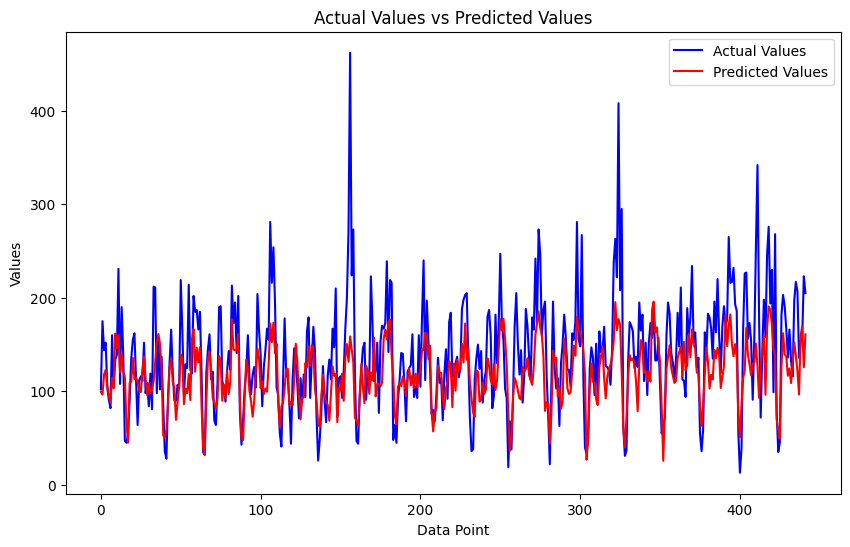

In [22]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(range(len(y_test)), y_test, label='Actual Values', color='blue')
ax.plot(range(len(pred)), pred, label='Predicted Values', color='red')
ax.set_xlabel('Data Point')
ax.set_ylabel('Values')
ax.set_title('Actual Values vs Predicted Values')
ax.legend()

plt.show()

_Conclusion_: From the plots, it is evident that the model predicts values very close to the test values, indicating an acceptable accuracy of the model predictions, and it can be recommended for use.

__OVERALL CONCLUSION__:

- During the data loading stage from the dataset, it was established that the data is of good quality, without missing values and anomalous outliers. In this case, zero values in the target feature are logical, as the number of orders can be zero during certain time intervals.
- During the preprocessing stage, the date column was converted to the datetime64 format. Additionally, the datetime column was resampled hourly.
- During the data analysis stage, the following observations were made:
- The trend indicates an increase in the number of orders. It is challenging to determine the cause of this growth—whether it is a general trend of increasing orders that will continue or a seasonal trend related, for example, to the summer vacation period, leading to more people using taxi services from airports. A significant growth is observed precisely from June to the end of August. However, to speak with confidence, data from several years would be required.
- The data exhibits good seasonality, both on a monthly and weekly basis. The series is stationary, with a constant periodicity towards the end of each day, making it suitable for predicting peak hours.
- After training five models—Linear Regression, Decision Tree, Random Forest, CatBoost, and LightGBM—the CatBoost gradient descent model showed the best results with an RMSE of 31.73.

|Model|Time for Hyperparameter Tuning and Training (seconds)|Hyperparameters|RMSE|
|-----:|----:|----:|----:|
|Linear Regression|53.24|{'alpha'=0.01, 'max_lag': 24, 'rolling_mean_size': 3}|34.13| 
|Decision Tree|7.71|{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'max_lag': 24, 'rolling_mean_size': 5}|38.56| 
|Random Forest|137.32|{'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50, 'max_lag': 24, 'rolling_mean_size': 5}|33.22| 
|CatBoost|182|{'depth': 5, 'iterations': 300, 'learning_rate': 0.1, 'max_lag': 24, 'rolling_mean_size': 15}|31.73| 
|LightGBM|125|{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}|32.29| 

- After training the model and testing it on the test set, the gradient descent model showed an RMSE of 47.55. __As a result, a CatBoost gradient descent model was obtained with the following parameters: 'depth': 5, 'iterations': 300, 'learning_rate': 0.1, 'max_lag': 40, 'rolling_mean_size': 15. It is noteworthy that the prediction speed of such a model is only 0.0039 seconds. This allows recommending such a model for use in forecasting the number of cars for each subsequent hour.__